In [198]:
# from updated_methods import *

In [ ]:
from datetime import datetime
from typing import Dict
import pandas as pd
import matplotlib.pyplot as plt
import math
import randomcolor
import copy
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

class ORDER:
    def __init__(self, pre_stage_order: 'ORDER' , next_stage_order: 'ORDER' , ID: int, w: int, mold_ID: int, may: 'MAY', start_day: datetime, deadline_day: datetime, setup_time: int, processing_time: dict):
        self.order_in_pre_stage = pre_stage_order   # ORDER - Order in previous stage
        self.order_in_next_stage = next_stage_order    # ORDER - Order in next stage
        self.ID = ID   # number
        self.w = w    # number
        self.mold_ID = mold_ID   # number
        self.may = may      # object MAY
        self.duration = self.cal_duration(start_day, deadline_day)   # number
        self.setup_time = setup_time    # number
        self.processing_time = processing_time   # dict ( {'Máy 9': 83.9025, 'Máy 10': 55.935} )
        self.g: int = 0
        self.pre: ORDER  = None  # ORDER in a machine
        self.next: ORDER  = None  # ORDER in a machine
        self.begin: int  = None   # number in a machine
        self.end: int  = None   # number in a machine

    def print_object(self):
        print("Current order:", self.ID)
        print("In previous stage:", None if self.order_in_pre_stage is None else self.order_in_pre_stage.ID) 
        print("In next stage:", None if self.order_in_next_stage is None else self.order_in_next_stage.ID) 
        print("Previous order in the current machine:", None if self.pre is None else self.pre.ID) 
        print("Next order in the current machine:", None if self.next is None else self.next.ID) 

    def cal_duration(self, start_day: datetime, deadline_day: datetime) -> float:
        d = deadline_day - start_day  # Tính tổng thời gian chênh lệch
        total_days = d.days + 1       # Số ngày chênh lệch (không tính giờ, phút)
        extra_hours = d.seconds / 3600  # Số giờ lẻ trong ngày cuối cùng
        total_hours = total_days * 24 + extra_hours
        return round(total_hours, 4)   # Làm tròn đến 4 chữ số thập phân

class MAY:
    def __init__(self, name_stage, name_may):
        self.head: ORDER = None
        self.tail: ORDER = None
        self.no_orders: int = 0
        self.name_may: str = name_may
        self.name_stage: str = name_stage

    def print_object(self):
        print("Machine:", self.name_may)
        print("Stage:", self.name_stage)
        print("Head:", None if self.head is None else self.head.ID)
        print("Tail:", None if self.tail is None else self.tail.ID)
        print("Number of orders:", self.no_orders)
    
    def index(self, idx):
        try:
            current_order = self.head
            i = 0
            while(i<idx):
                i += 1
                current_order = current_order.next
        except:
            print('Index out of range.')
            return 0
        return current_order
    
    def get_no_orders(self, ):
        current_order = self.head
        i = 0
        while(current_order is not None):
            i += 1
            current_order = current_order.next
        return i
    
    def get_all_setuptime(self, ):
        current_order = self.head
        setup_time_list = []
        while(current_order is not None):
            setup_time_list.append(current_order.setup_time)
            current_order = current_order.next
        return setup_time_list
    
    def get_all_moldID(self, ):
        current_order = self.head
        mold_ID_list = []
        while(current_order is not None):
            mold_ID_list.append(current_order.mold_ID)
            current_order = current_order.next
        return mold_ID_list
    
    def get_all_processing_time(self, ):
        current_order = self.head
        processing_time_list = []
        while(current_order is not None):
            processing_time_list.append(current_order.processing_time)
            current_order = current_order.next
        return processing_time_list
    

In [ ]:
class NEW_TABU_SEARCH:
    def __init__(self, data_path, info_may_path):
        self.data = self.read_data(data_path)
        self.data = self.data.fillna(0)
        self.colors = self.generate_color()
        self.before = []
        self.after = []
        self.ncheck = 0
        self.nswap = 0
        self.nmove = 0
        self.goal = 0  # T * w

        # self.data = pd.read_excel(data_path, usecols=lambda x: x not in ['Due Date'])
# fix 25/02/2025
# Sửa
        # self.setup_time = {
        #                     'Cưa phôi máy lớn': [0, 0],
        #                     'Cắt phôi': [0, 0],
        #                     'Khoan': [0, 0],
        #                     'CNC tiện': [0, 0]
        #                 }
        # self.setup_time = {
        #                     'Ép': [0] * 2,                        
        #                     'In lụa': [0] * 2                           
        #                 }
        self.setup_time = {
                            'Cưa phôi máy lớn': [0] * 10,
                            'Cắt phôi': [0] * 10,
                            'Khoan': [0] * 6,
                            'CNC tiện': [0] * 10,
                            'Phay CNC 3T': [0] * 10,
                            'Phay CNC 4T': [0] * 10,
                            'Phay CNC 5T': [0] * 10,
                            'Mài': [0] * 10
                        }

        self.info_may_dict = self.preprocess_info_may(info_may_path)
        self.setup_time_dict = self.initial_setup_time_dict()
        self.machine_objects = self.initial_machine_objects()
        self.initial()
        self.handle_update_time()

    def conver_str_to_datetime(self, datetime_str):
        if (type(datetime_str) is not str):
            return datetime_str
        datetime_object = datetime.strptime(datetime_str, '%d/%m/%Y')
        return datetime_object
    
    def read_data(self, data_path):
        data = pd.read_excel(data_path, usecols=lambda x: x not in ['Due Date'])
        data = data.sort_values(by=['Ngày tới hạn', 'Trọng số'], ascending=[True, False])
        return data
        
    def preprocess_info_may(self, info_may_path):
        info_may = pd.read_excel(info_may_path)
        info_may_dict = {}
        ten_cong_doan = ''
        # Danh_sach_may = []
        for i in range(len(info_may)):
            if pd.isnull(info_may['Tên công đoạn'][i]) != True:
                ten_cong_doan = info_may['Tên công đoạn'][i]
                info_may_dict[ten_cong_doan] = [info_may['Tên máy'][i]]
            else:
                info_may_dict[ten_cong_doan].append(info_may['Tên máy'][i])
            # Danh_sach_may.append(info_may['Tên máy'][i])
        return info_may_dict
    
    def initial_setup_time_dict(self, ):
        st_dict = {}
        for stage, mays in self.info_may_dict.items():
            for may in mays:
                st_dict[may] = self.setup_time[stage]
        return st_dict

    def initial_machine_objects(self, ) -> Dict[str, MAY]:
        machine_objects = {}
        for stage, may in self.info_may_dict.items():
            for m in may:
                machine_objects[m] = MAY(stage, m)
        return machine_objects
    
    def find_min_processing_time(self, processing_time_stage):
        may_to_add = min(processing_time_stage, key=processing_time_stage.get)
        min_time_processing = 1000000
        for mm in processing_time_stage.keys():
            if self.machine_objects[mm].tail is None:
                min_time_processing = 0
                may_to_add = mm
            elif self.machine_objects[mm].tail.end < min_time_processing:
                min_time_processing = self.machine_objects[mm].tail.end
                may_to_add = mm
        return may_to_add
    
    def initial(self, ):
        for i in range(len(self.data)):

            is_first_stage = True
            current_order_for_stage = None

            # Iterate through each stage
            for stage, mays in self.info_may_dict.items():
                print(self.data.iloc[i]['STT'], stage)

                processing_time_stage = {}
                
                for m in mays:
                    if self.data.iloc[i][m] != 0:
                        processing_time_stage[m] = self.data.iloc[i][m]
                
                if processing_time_stage != {}:
                    may_to_add = self.find_min_processing_time(processing_time_stage)

                    start_date = self.conver_str_to_datetime(self.data.iloc[i]['Ngày sẵn sàng'])
                    deadline_date = self.conver_str_to_datetime(self.data.iloc[i]['Ngày tới hạn'])

                    order = ORDER(current_order_for_stage, None, self.data.iloc[i]['STT'], self.data.iloc[i]['Trọng số'], self.data.iloc[i]['Mã khuôn'], self.machine_objects[may_to_add], start_date, deadline_date, self.setup_time_dict[may_to_add][0], processing_time_stage)

                    if is_first_stage==True:
                        # Set is_first_stage to False to indicate that the order has been added to the first stage
                        is_first_stage = False
                        current_order_for_stage = order

                        self.add_order(current_order_for_stage, may_to_add)
                    else:
                        # Set the order_in_next_stage and order_in_pre_stage attributes for the current order and the new order

                        current_order_for_stage.order_in_next_stage = order
                        order.order_in_pre_stage = current_order_for_stage

                        current_order_for_stage = order

                        self.add_order(current_order_for_stage, may_to_add)
    
    def add_order(self, order: ORDER, ID_may: str):
        # Get the machine object
        may = self.machine_objects[ID_may]
        total_time = order.processing_time[ID_may] # + order.setup_time (order.setup_time = 0)

        if order.order_in_pre_stage is None:
            # If the machine is empty, add the order to the machine's head
            if may.head is None:
                order.begin = 0
                order.end = total_time
                may.head = order
                may.tail = may.head
                return
          
            if may.head.begin != 0 and may.head.begin >= total_time:
                order.begin = 0
                order.end = total_time

                # Add to the linked list
                order.next = may.head
                may.head.pre = order
                may.head = order
                return
        
            current_order = may.head
            while current_order.next is not None:
                # Insert the order between current_order and current_order.next
                if current_order.next.begin - current_order.end >= total_time:
                    order.begin = current_order.end
                    order.end = order.begin + total_time

                    # Add to the linked list
                    current_order.next.pre = order
                    order.next = current_order.next
                    current_order.next = order
                    order.pre = current_order
                    return
                current_order = current_order.next
                
            order.begin = current_order.end
            order.end = current_order.end + total_time

            current_order.next = order
            order.pre = current_order
            order.next = None

            # Modify the tail of the linked list
            may.tail = order
                 
        else:
          
            if may.head is None:
                # We assume that the setup time is 0
                order.begin = order.order_in_pre_stage.end

                order.end = order.order_in_pre_stage.end + total_time

                order.next = None
                order.pre = None

                may.head = order
                may.tail = order

                return
            
            if may.head.begin != 0:
               
                if may.head.begin >= order.order_in_pre_stage.end + total_time:
                  
                    order.begin = order.order_in_pre_stage.end
                    order.end = order.order_in_pre_stage.end + total_time

                    order.next = may.head
                    order.pre = None

                    may.head.pre = order
                    may.head = order
                    
                    return
            
            current_order = may.head
            while current_order.next is not None:
                if current_order.end >= order.order_in_pre_stage.end:
                    if (current_order.next is not None and current_order.next.begin - current_order.end >= total_time):
                        order.begin = current_order.end
                        order.end = current_order.end + total_time

                        current_order.next.pre = order
                        order.next = current_order.next
                        current_order.next = order
                        order.pre = current_order
                        return
                
                current_order = current_order.next
            
            order.begin = max(order.order_in_pre_stage.end, current_order.end)
            order.end = order.begin + total_time

            current_order.next = order
            order.pre = current_order
            order.next = None

            may.tail = order

    def super_swap(self, cur_order: ORDER, next_order: ORDER, force_swap: bool = False) -> bool:     
        if force_swap is False:
            if (next_order.order_in_pre_stage is not None and next_order.order_in_pre_stage.end > cur_order.end):
                return False

        self.handle_swap(cur_order, next_order)

        self.handle_update_time()

        return True
        
    def handle_swap(self, first_order: ORDER, second_order: ORDER):
   
        adjacent = first_order.next == second_order and second_order.pre == first_order

        if first_order.pre:
            first_order.pre.next = second_order
        if first_order.next and not adjacent:
            first_order.next.pre = second_order
            
        if second_order.next:
            second_order.next.pre = first_order
        if second_order.pre and not adjacent:
            second_order.pre.next = first_order

        next_of_first_order = first_order.next if not adjacent else first_order
        pre_of_second_order = second_order.pre if not adjacent else second_order
        second_order.pre = first_order.pre
        first_order.next = second_order.next
        first_order.pre = pre_of_second_order
        second_order.next = next_of_first_order
   
        if second_order.pre is None:
            second_order.may.head = second_order
        if first_order.next is None:
            first_order.may.tail = first_order

    def handle_update_time(self):
   
        start_to_update = False
  
        self.goal = 0

        for stage, name_mays in self.info_may_dict.items():
            for name_may in name_mays:
                may = self.machine_objects[name_may]
                self.update_time_within_machine(may)

    def update_time_within_machine(self, may: MAY):
        cur_order = may.head
        while cur_order is not None:
            cur_order.begin = max(
                cur_order.pre.end if cur_order.pre is not None else 0,
                cur_order.order_in_pre_stage.end if cur_order.order_in_pre_stage is not None else 0
            )
            cur_order.end = cur_order.begin + cur_order.processing_time[may.name_may]

            if cur_order.order_in_next_stage is None and cur_order.end - cur_order.duration > 0:
                cur_order.g = (cur_order.end - cur_order.duration) * cur_order.w
                self.goal += cur_order.g
            else:
 
                pass
            cur_order = cur_order.next

    def super_move(self, from_order: ORDER, to_may: MAY, to_order: ORDER | None): # to_order is None means the last position of the machine
 
        if (from_order.processing_time.get(to_may.name_may, None) is None):
            return False

        self.handle_move(from_order, to_may, to_order)
        
        self.handle_update_time()
        return True        

    def handle_move(self, from_order: ORDER, to_may: MAY, to_order: ORDER | None):
    
        if from_order.pre is not None:
            from_order.pre.next = from_order.next
        if from_order.next is not None:
            from_order.next.pre = from_order.pre

        if (from_order.may.head == from_order):
            from_order.may.head = from_order.next
        if (from_order.may.tail == from_order):
            from_order.may.tail = from_order.pre
     
        if to_order is not None:
            from_order.next = to_order
            if (to_order.pre is not None):
                to_order.pre.next = from_order
            from_order.pre = to_order.pre
            to_order.pre = from_order

            if (to_may.head == to_order):
                to_may.head = from_order
        else:
            if (to_may.tail is not None):
                to_may.tail.next = from_order
                from_order.pre = to_may.tail
                from_order.next = None
                to_may.tail = from_order
            else:
                to_may.head = from_order
                to_may.tail = from_order
                from_order.pre = None
                from_order.next = None
    
        from_order.may = to_may

    def generate_color(self, ):
        colors = []
        colors.append('#c90606')
        i = 0
        while(i < len(self.data)):
            i += 1
            cl = randomcolor.RandomColor().generate()[0]
            if cl in colors is True:
                i -= 1
                continue
            colors.append(cl)
        return colors
    
    # Fix 25/02/2025        
    def draw_ganttchart(self, fig_width, bar_height):
        def plot_bar(y, begin, end, ID, hatch):
            ax.barh(
                y=y,
                width=(end - begin),
                left=begin,
                color=self.colors[ID],
                height=bar_height,
                edgecolor='black',
                linewidth=0,
                hatch=hatch
            )
            label_position = begin + (end - begin) / 2
            if hatch == '':
                ax.text(
                    label_position,
                    y,
                    ID,
                    ha='center',
                    va='center',
                    color='white',
                    fontsize=bar_height * 20
                )

        # Cấu hình spacing và chiều cao hình
        line_spacing = 1.2
        y_offset = bar_height * 0.3
        fig_height = bar_height * line_spacing * len(self.machine_objects) + bar_height * 0.3

        fig, ax = plt.subplots(figsize=(fig_width, fig_height))
        ax.set_facecolor('#d3d3d3')

        yticks = [i * bar_height * line_spacing + y_offset for i in range(len(self.machine_objects))]
        ylabels = []
        i = 0
        for ID_may, may in self.machine_objects.items():
            ylabels.append(f'{ID_may}')
            cur = may.head
            while cur is not None:
                y_pos = i * bar_height * line_spacing + y_offset
                plot_bar(y_pos, cur.begin, cur.end, cur.ID, '')
                if cur.begin > cur.duration:
                    plot_bar(y_pos, cur.begin, cur.end, cur.ID, '///')
                    cur = cur.next
                    continue
                if cur.end >= cur.duration and cur.begin <= cur.duration:
                    plot_bar(y_pos, cur.duration, cur.end, cur.ID, '///')
                    cur = cur.next
                    continue
                cur = cur.next
            i += 1

        ax.set_yticks(yticks)
        ax.set_yticklabels(ylabels)
        ax.tick_params(labelsize=bar_height * 30)
        plt.title('GANTT CHART 96 ORDERS', fontsize=bar_height * 60)
        ax.grid(axis="x")
        plt.tight_layout()
        plt.show()


    def print_time_orders(self, ):
        for name, may in self.machine_objects.items():
            print('***', name)
            cur = may.head
            while cur is not None:
                deadline = cur.end - cur.duration
                if deadline < 0:
                    deadline = 0
                print(f'- Đơn hàng {cur.ID} bắt đầu {cur.begin} kết thúc {cur.end} thời gian trễ {deadline}')
                cur = cur.next

In [ ]:
class NEW_SOLVE:
    def __init__(self, tabu):
        self.tabu: NEW_TABU_SEARCH = tabu
        self.best_solve = copy.deepcopy(self.tabu.machine_objects)
        self.best_goal = self.tabu.goal
        self.tabu_list = []
        self.cur_tl = ()
        self.steps = []
        self.best_step = []
        self.cur_no_neighbors = 0
        self.ten_best_neighbors = []
        self.goal_history = []
        self.best_goal_history = []
        
    def solve(self ):
        max_bad_loop = 0
        n = 0
        while True:
            self.cur_no_neighbors = 0
            n += 1

            best_sol, best_g, ten_best = self.super_neighbors_loop()
            self.ten_best_neighbors.append(ten_best)
            print(f'___________________________ Lần lặp thứ {n} ________________________________')
            print('Mục tiêu tốt nhất: ', best_g)
            print('Tổng số lân cận: ', self.cur_no_neighbors)

            if best_g == 9999999999:
                return 
            
            if math.isnan(best_g) == False:
                if round(best_g, 4) >= round(self.best_goal, 4):
                    max_bad_loop += 1
                    print('/////////////////////// max_bad_loop: ', max_bad_loop)
                    # Sửa
                    # if max_bad_loop >= 20:
                    # if max_bad_loop >= 50:
                    # if max_bad_loop >= 80:
                    if max_bad_loop >= 100:
                    # if max_bad_loop >= 400:
                        self.tabu.goal = self.best_goal
                        self.tabu.machine_objects = copy.deepcopy(self.best_solve)
                        return
                else:
                    max_bad_loop = 0

                # If the current goal is better than the best goal, update the best goal and the best solve
                # Also set the machine state to the best solve
                if (best_g < self.best_goal):
                    self.best_goal = best_g
                    self.best_solve = copy.deepcopy(best_sol)
                    
                # Update the machines' stage and add the current list to tabulist
                # Add the current tabu list to the tabu list
                # if self.cur_tl not in self.tabu_list: Don't need to check since the cur_tl should not in the tabu list
                self.tabu_list.append(self.cur_tl)
                # Sửa
                if len(self.tabu_list) > 9:
                # if len(self.tabu_list) > 2:
                    self.tabu_list.pop(0)
                self.tabu.machine_objects = best_sol # Don't need to use deepcopy
                self.tabu.goal = best_g

                print("Current step: ", self.cur_tl)
                print("Ten best: ", len(ten_best))

                self.goal_history.append(best_g) 
                self.best_goal_history.append(self.best_goal)

    def draw_cost(self, ):
        plt.figure()
        ids = [i for i in range(1, 1+len(self.goal_history))]
        plt.plot(ids, self.goal_history)
        plt.xlabel("Số lần lặp")
        plt.ylabel("Hàm mục tiêu")
        plt.show()

    def draw_best_cost(self, ):
        plt.figure()
        ids = [i for i in range(1, 1+len(self.best_goal_history))]
        plt.plot(ids, self.best_goal_history)
        plt.xlabel("Số lần lặp")
        plt.ylabel("Hàm mục tiêu")
        plt.show()
    
    def super_check_tabu_list(self, tabu_entry: list):
        if tabu_entry in self.tabu_list or (tabu_entry[0], tabu_entry[3], tabu_entry[2], tabu_entry[1]) in self.tabu_list:
            return True
        return False
    
    def super_neighbors_loop(self, ):
        best_sol = None
        best_g = 9999999999
        ten_best = []

        # Loop for finding all swap cases
        for stage, name_mays in self.tabu.info_may_dict.items():
            for name_may in name_mays:
                may = self.tabu.machine_objects[name_may]
                first_order = may.head
                while first_order is not None:
                    cur_order = first_order
                    while cur_order.next is not None:
                        # print("Next order in original order: ", cur_order.next)
                        second_order = cur_order.next

                        # Check if the swap is in the tabu list
                        if self.super_check_tabu_list(("SWAP", first_order.ID, may.name_may, second_order.ID)) is True:
                            cur_order = cur_order.next
                            continue

                        swap_success = self.tabu.super_swap(first_order, second_order)
                        if swap_success:
                            # print("Current goal: ", self.tabu.goal)
                            self.cur_no_neighbors += 1

                            if (self.tabu.goal <= best_g):
                                best_g = self.tabu.goal
                                best_sol = copy.deepcopy(self.tabu.machine_objects)
                                ten_best.append(best_sol)
                                if len(ten_best) > 10:
                                    ten_best.pop(0)

                                self.cur_tl = ("SWAP", first_order.ID, may.name_may, second_order.ID)
 
                            # Revert to the original state
                            self.tabu.super_swap(second_order, first_order, force_swap=True)

                        cur_order = cur_order.next
                    first_order = first_order.next
                    

        # Loop for finding all move cases
        for stage in self.tabu.info_may_dict.keys():
  
            for name_may in self.tabu.info_may_dict[stage]:
                may = self.tabu.machine_objects[name_may]
                cur_order = may.head
                while cur_order is not None:
 
                    remaining_machines = [m for m in self.tabu.info_may_dict[stage] if m != name_may]
                    for remaining_machine in remaining_machines:
                        remaining_may = self.tabu.machine_objects[remaining_machine]
  
                        new_pos_order = remaining_may.head
                        while new_pos_order is not None:
                            revert_order = cur_order.next

                            # Check if the move is in the tabu list
                            if self.super_check_tabu_list(("MOVE", cur_order.ID, remaining_machine, new_pos_order.ID)) is True:
                                new_pos_order = new_pos_order.next
                                continue

                            if self.tabu.super_move(cur_order, remaining_may, new_pos_order) is not False:
                                # print("Current goal: ", self.tabu.goal)
                                self.cur_no_neighbors += 1

                                if (self.tabu.goal <= best_g):
                                    best_g = self.tabu.goal
                                    best_sol = copy.deepcopy(self.tabu.machine_objects)
                                    ten_best.append(best_sol)
                                    if len(ten_best) > 10:
                                        ten_best.pop(0)

                                    self.cur_tl = ("MOVE", cur_order.ID, remaining_machine, new_pos_order.ID)

                                # Debug
                                # print("After move: ")
                                # self.tabu.draw_ganttchart(20, 0.5)
                                
                                # Revert to the original state
                                self.tabu.super_move(cur_order, may, revert_order)

                                # Debug
                                # print("Revert")
                                # self.tabu.draw_ganttchart(20, 0.5)

                            new_pos_order = new_pos_order.next
                        else:
                            revert_order = cur_order.next
                            
                            # Check if the move is in the tabu list
                            if self.super_check_tabu_list(("MOVE", cur_order.ID, remaining_machine, None)) is True:
                                # cur_order = cur_order.next
                                break

                            if self.tabu.super_move(cur_order, remaining_may, None) is True:
                                # print("Current goal: ", self.tabu.goal)
                                self.cur_no_neighbors += 1
                                
                                if (self.tabu.goal <= best_g):
                                    best_g = self.tabu.goal
                                    best_sol = copy.deepcopy(self.tabu.machine_objects)
                                    ten_best.append(best_sol)
                                    if len(ten_best) > 10:
                                        ten_best.pop(0)

                                    self.cur_tl = ("MOVE", cur_order.ID, remaining_machine, None)

                                # Revert to the original state
                                self.tabu.super_move(cur_order, may, revert_order)

                    cur_order = cur_order.next

        return best_sol, best_g, ten_best
        
    def print_top10(self, ):
        i = -1  
        for top10 in self.ten_best_neighbors:
            i += 1
            print(f'___________________________ Lần lặp thứ {i+1} ________________________________')
            # print(top10)
            for j in range(len(top10)):
                top10_list = []
                # j = 0
                for stage, mays in self.tabu.info_may_dict.items():
                    stage_list = []
                    for may in mays:
                        # j += 1
                        may_list = []
                        cur = top10[j][may].head
                        # print(may, cur.ID)
                        while cur is not None:
                            may_list.append(cur.ID)
                            cur= cur.next
                        stage_list.append(may_list)
                    top10_list.append(stage_list)
                print(top10_list)
    def print_last(self):
        if not self.ten_best_neighbors:
            print("Danh sách rỗng.")
            return
        
        for i, top10 in enumerate(self.ten_best_neighbors):
            print(f'___________________________ Lần lặp thứ {i+1} ________________________________')
            
            if not top10:
                print("Không có dữ liệu trong lần lặp này.")
                continue
            
            last_top = top10[-1]  # Lấy phần tử cuối cùng của mỗi lần lặp
            top10_list = []
            
            for stage, mays in self.tabu.info_may_dict.items():
                stage_list = []
                for may in mays:
                    may_list = []
                    cur = last_top[may].head
                    while cur is not None:
                        may_list.append(int(cur.ID))  # Ép kiểu về int để tránh np.int64
                        cur = cur.next
                    stage_list.append(may_list)
                top10_list.append(stage_list)
            
            print(top10_list)


1 Cưa phôi máy lớn
1 Cắt phôi
1 Khoan
1 CNC tiện
1 Phay CNC 3T
1 Phay CNC 4T
1 Phay CNC 5T
1 Mài
3 Cưa phôi máy lớn
3 Cắt phôi
3 Khoan
3 CNC tiện
3 Phay CNC 3T
3 Phay CNC 4T
3 Phay CNC 5T
3 Mài
7 Cưa phôi máy lớn
7 Cắt phôi
7 Khoan
7 CNC tiện
7 Phay CNC 3T
7 Phay CNC 4T
7 Phay CNC 5T
7 Mài
6 Cưa phôi máy lớn
6 Cắt phôi
6 Khoan
6 CNC tiện
6 Phay CNC 3T
6 Phay CNC 4T
6 Phay CNC 5T
6 Mài
4 Cưa phôi máy lớn
4 Cắt phôi
4 Khoan
4 CNC tiện
4 Phay CNC 3T
4 Phay CNC 4T
4 Phay CNC 5T
4 Mài
5 Cưa phôi máy lớn
5 Cắt phôi
5 Khoan
5 CNC tiện
5 Phay CNC 3T
5 Phay CNC 4T
5 Phay CNC 5T
5 Mài
8 Cưa phôi máy lớn
8 Cắt phôi
8 Khoan
8 CNC tiện
8 Phay CNC 3T
8 Phay CNC 4T
8 Phay CNC 5T
8 Mài
2 Cưa phôi máy lớn
2 Cắt phôi
2 Khoan
2 CNC tiện
2 Phay CNC 3T
2 Phay CNC 4T
2 Phay CNC 5T
2 Mài
11 Cưa phôi máy lớn
11 Cắt phôi
11 Khoan
11 CNC tiện
11 Phay CNC 3T
11 Phay CNC 4T
11 Phay CNC 5T
11 Mài
13 Cưa phôi máy lớn
13 Cắt phôi
13 Khoan
13 CNC tiện
13 Phay CNC 3T
13 Phay CNC 4T
13 Phay CNC 5T
13 Mài
12 Cưa phôi má

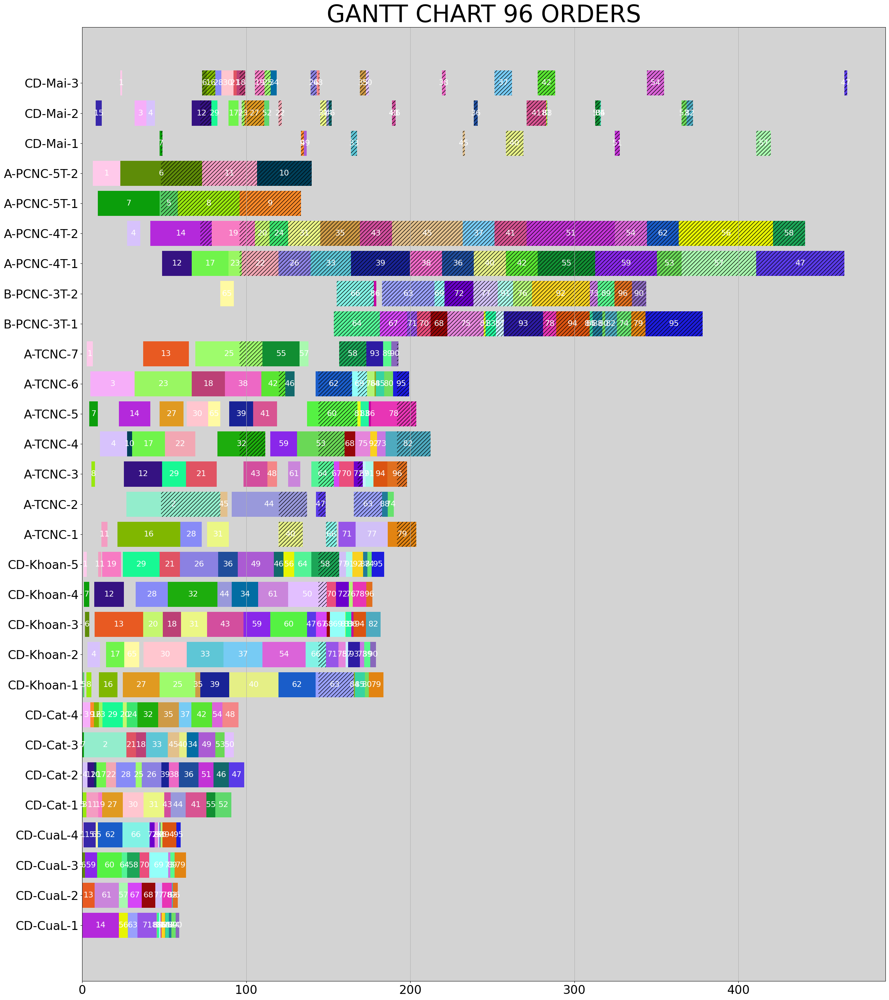

In [202]:
# tabu = NEW_TABU_SEARCH('Sample_Harry_Thong_tin_dau_vao.xlsx', 'Sample_Harry_Thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('Optimal_Harry_Thong_tin_dau_vao.xlsx', 'Optimal_Harry_Thong_tin_may.xlsx')

# ====================================================
# tabu = NEW_TABU_SEARCH('V2_Data_25_Full_Harry_Thong_tin_dau_vao.xlsx', 'Full_Harry_Thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('V2_Data_53_Full_Harry_Thong_tin_dau_vao.xlsx', 'Full_Harry_Thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('V2_Data_80_Full_Harry_Thong_tin_dau_vao.xlsx', 'Full_Harry_Thong_tin_may.xlsx')
tabu = NEW_TABU_SEARCH('Data_96_Full_Harry_Thong_tin_dau_vao.xlsx', 'Full_Harry_Thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('Data_113_Full_Harry_Thong_tin_dau_vao.xlsx', 'Full_Harry_Thong_tin_may.xlsx')
# ====================================================

# tabu = NEW_TABU_SEARCH('Sample_Phuong_thong_tin_dau_vao.xlsx', 'Sample_Phuong_thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('Full_Phuong_thong_tin_dau_vao.xlsx', 'Full_Phuong_thong_tin_may.xlsx')
# tabu = NEW_TABU_SEARCH('Optimal_Phuong_thong_tin_dau_vao.xlsx', 'Optimal_Phuong_thong_tin_may.xlsx')

tabu.draw_ganttchart(fig_width=25, bar_height=0.8)
# tabu.draw_ganttchart(fig_width=50, bar_height=2)  # Điều chỉnh thông số nếu cần

In [175]:
tabu.goal

np.float64(777.7036516666667)

In [176]:
# Impor Tabu Search
new_solve = NEW_SOLVE(tabu)

In [177]:
new_solve.solve()

___________________________ Lần lặp thứ 1 ________________________________
Mục tiêu tốt nhất:  673.8154525000002
Tổng số lân cận:  1482
Current step:  ('SWAP', np.int64(14), 'B-PCNC-3T-2', np.int64(6))
Ten best:  10
___________________________ Lần lặp thứ 2 ________________________________
Mục tiêu tốt nhất:  635.8737525000001
Tổng số lân cận:  1482
Current step:  ('MOVE', np.int64(19), 'CD-Mai-1', np.int64(10))
Ten best:  10
___________________________ Lần lặp thứ 3 ________________________________
Mục tiêu tốt nhất:  599.0749275000001
Tổng số lân cận:  1488
Current step:  ('MOVE', np.int64(23), 'A-PCNC-5T-1', np.int64(22))
Ten best:  10
___________________________ Lần lặp thứ 4 ________________________________
Mục tiêu tốt nhất:  569.0390108686668
Tổng số lân cận:  1488
Current step:  ('MOVE', np.int64(12), 'B-PCNC-3T-2', np.int64(8))
Ten best:  10
___________________________ Lần lặp thứ 5 ________________________________
Mục tiêu tốt nhất:  541.5447858686668
Tổng số lân cận:  1488
C

np.float64(389.2094833333333)

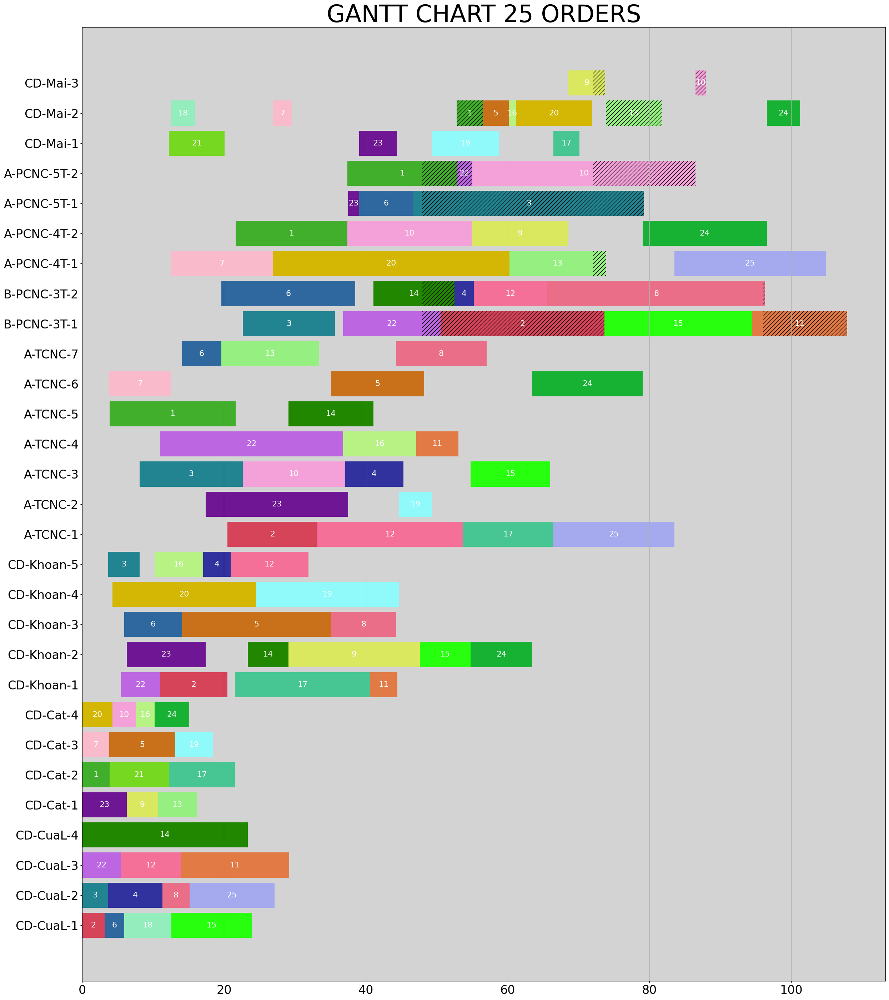

In [178]:
# Print Goal Tabu Search
tabu.goal
# tabu.draw_ganttchart(40, 1.2)
tabu.draw_ganttchart(fig_width=25, bar_height=0.8)

In [10]:
new_solve.print_top10()

___________________________ Lần lặp thứ 1 ________________________________
[[[np.int64(14), np.int64(56), np.int64(57), np.int64(66), np.int64(72), np.int64(77), np.int64(81), np.int64(87), np.int64(86), np.int64(88), np.int64(89), np.int64(80), np.int64(96), np.int64(74), np.int64(79)], [np.int64(13), np.int64(61), np.int64(64), np.int64(58), np.int64(71), np.int64(76), np.int64(92), np.int64(94), np.int64(73), np.int64(82)], [np.int64(6), np.int64(15), np.int64(65), np.int64(62), np.int64(67), np.int64(68), np.int64(75), np.int64(84)], [np.int64(1), np.int64(59), np.int64(60), np.int64(63), np.int64(70), np.int64(69), np.int64(83), np.int64(91), np.int64(93), np.int64(78), np.int64(85), np.int64(90), np.int64(95)]], [[np.int64(5), np.int64(12), np.int64(10), np.int64(19), np.int64(23), np.int64(29), np.int64(21), np.int64(32), np.int64(35), np.int64(36), np.int64(42), np.int64(46), np.int64(50)], [np.int64(4), np.int64(11), np.int64(22), np.int64(30), np.int64(18), np.int64(31), np.i

In [11]:
new_solve.print_last()

___________________________ Lần lặp thứ 1 ________________________________
[[[14, 56, 57, 66, 72, 77, 81, 87, 86, 88, 89, 80, 96, 74, 79], [13, 61, 64, 58, 71, 76, 92, 94, 73, 82], [6, 15, 65, 62, 67, 68, 75, 84], [1, 59, 60, 63, 70, 69, 83, 91, 93, 78, 85, 90, 95]], [[5, 12, 10, 19, 23, 29, 21, 32, 35, 36, 42, 46, 50], [4, 11, 22, 30, 18, 31, 43, 44, 41, 51, 48], [7, 8, 2, 27, 20, 25, 26, 39, 38, 40, 34, 55, 52], [3, 9, 16, 17, 28, 24, 33, 45, 37, 49, 54, 53, 47]], [[5, 12, 30, 33, 36, 49, 54, 66, 71, 75, 83, 91, 92, 84, 79], [4, 17, 29, 18, 31, 39, 34, 61, 50, 70, 77, 81, 87, 86, 94, 73, 89, 96], [6, 13, 20, 21, 26, 44, 40, 46, 56, 64, 58, 72, 76, 78, 80, 82], [7, 8, 11, 19, 28, 25, 35, 43, 59, 60, 47, 63, 88, 90], [1, 16, 27, 32, 37, 65, 62, 67, 68, 69, 93, 85, 74, 95]], [[10, 11, 17, 28, 32, 60, 69, 76, 78], [2, 29, 31, 40, 47, 67, 70, 81, 85, 88, 79], [8, 13, 57, 18, 45, 44, 59, 48, 58, 91, 86, 94, 82], [4, 16, 27, 43, 65, 64, 71, 77, 89, 96], [7, 12, 30, 38, 41, 55, 46, 53, 63, 9

In [41]:
new_solve.tabu_list

[('MOVE', np.int64(37), 'CD-Mai-3', np.int64(14)),
 ('MOVE', np.int64(37), 'CD-Mai-2', np.int64(58)),
 ('MOVE', np.int64(37), 'CD-Mai-3', np.int64(16)),
 ('MOVE', np.int64(37), 'CD-Mai-2', np.int64(45)),
 ('MOVE', np.int64(76), 'CD-Mai-3', np.int64(74)),
 ('MOVE', np.int64(76), 'CD-Mai-2', np.int64(35)),
 ('MOVE', np.int64(71), 'CD-Mai-3', np.int64(14)),
 ('MOVE', np.int64(71), 'CD-Mai-2', np.int64(45)),
 ('MOVE', np.int64(37), 'CD-Mai-3', np.int64(48))]

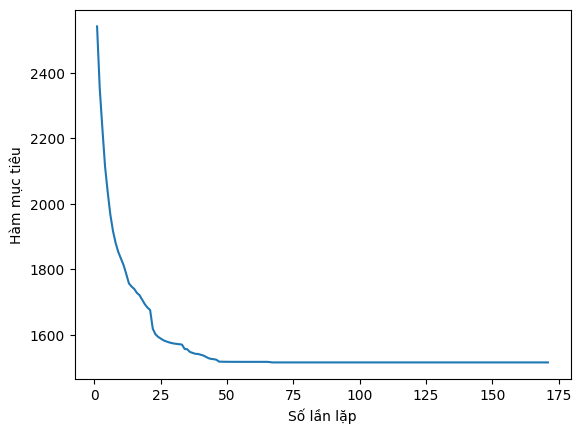

In [42]:

new_solve.draw_cost()

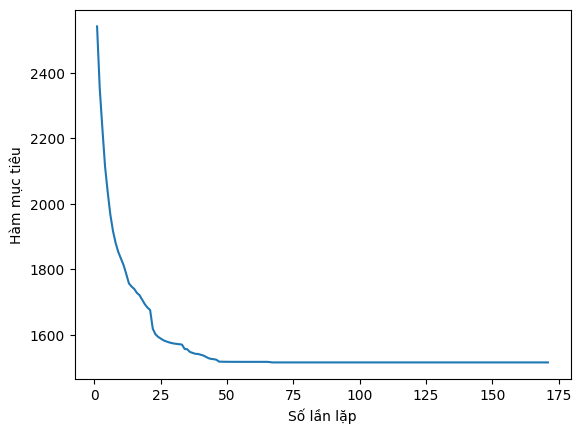

In [43]:
new_solve.draw_best_cost()

In [44]:
tabu.print_time_orders()

*** CD-CuaL-1
- Đơn hàng 10 bắt đầu 0 kết thúc 6.166666666666667 thời gian trễ 0
- Đơn hàng 11 bắt đầu 6.166666666666667 kết thúc 7.666666666666667 thời gian trễ 0
- Đơn hàng 7 bắt đầu 7.666666666666667 kết thúc 11.0 thời gian trễ 0
- Đơn hàng 8 bắt đầu 11.0 kết thúc 26.666666666666664 thời gian trễ 0
- Đơn hàng 43 bắt đầu 26.666666666666664 kết thúc 33.0 thời gian trễ 0
- Đơn hàng 32 bắt đầu 33.0 kết thúc 39.166666666666664 thời gian trễ 0
- Đơn hàng 52 bắt đầu 39.166666666666664 kết thúc 50.13333333333333 thời gian trễ 0
- Đơn hàng 50 bắt đầu 50.13333333333333 kết thúc 57.96666666666667 thời gian trễ 0
- Đơn hàng 13 bắt đầu 57.96666666666667 kết thúc 70.96666666666667 thời gian trễ 0
*** CD-CuaL-2
- Đơn hàng 3 bắt đầu 0 kết thúc 2.8333333333333335 thời gian trễ 0
- Đơn hàng 51 bắt đầu 2.8333333333333335 kết thúc 16.933333333333334 thời gian trễ 0
- Đơn hàng 18 bắt đầu 16.933333333333334 kết thúc 21.933333333333334 thời gian trễ 0
- Đơn hàng 19 bắt đầu 21.933333333333334 kết thúc 32.7

In [ ]:
import pandas as pd
import re

# Chuỗi dữ liệu từ đầu vào (có thể thay đổi hoặc đọc từ file)
raw_data = """
"""

# Tách từng lần lặp
pattern = r"___________________________ Lần lặp thứ (\d+) ________________________________\n(.*?)\n(?=___________________________ Lần lặp thứ|\Z)"
matches = re.findall(pattern, raw_data, re.DOTALL)

# Xử lý dữ liệu
data = []
for iteration, value in matches:
    # Tách từng trình tự riêng biệt (dựa vào dấu `[[[` để chia)
    sequences = re.findall(r"\[\[\[.*?\]\]\]", value, re.DOTALL)
    
    for seq in sequences:
        cleaned_seq = seq.replace("\n", "").replace("np.int64(", "").replace(")", "").replace(" ", "")
        data.append((int(iteration), cleaned_seq))

# Tạo DataFrame từ dữ liệu
df = pd.DataFrame(data, columns=["Lần lặp", "Giá trị"])

# Xuất ra file Excel
df.to_excel("Test.xlsx", index=False)

print("File 'Test.xlsx' đã được tạo thành công!")


File 'Test_93.xlsx' đã được tạo thành công!


In [45]:
import re
import pandas as pd

# Dữ liệu dạng text
data = """
*** CD-CuaL-1
- Đơn hàng 10 bắt đầu 0 kết thúc 6.166666666666667 thời gian trễ 0
- Đơn hàng 11 bắt đầu 6.166666666666667 kết thúc 7.666666666666667 thời gian trễ 0
- Đơn hàng 7 bắt đầu 7.666666666666667 kết thúc 11.0 thời gian trễ 0
- Đơn hàng 8 bắt đầu 11.0 kết thúc 26.666666666666664 thời gian trễ 0
- Đơn hàng 43 bắt đầu 26.666666666666664 kết thúc 33.0 thời gian trễ 0
- Đơn hàng 32 bắt đầu 33.0 kết thúc 39.166666666666664 thời gian trễ 0
- Đơn hàng 52 bắt đầu 39.166666666666664 kết thúc 50.13333333333333 thời gian trễ 0
- Đơn hàng 50 bắt đầu 50.13333333333333 kết thúc 57.96666666666667 thời gian trễ 0
- Đơn hàng 13 bắt đầu 57.96666666666667 kết thúc 70.96666666666667 thời gian trễ 0
*** CD-CuaL-2
- Đơn hàng 3 bắt đầu 0 kết thúc 2.8333333333333335 thời gian trễ 0
- Đơn hàng 51 bắt đầu 2.8333333333333335 kết thúc 16.933333333333334 thời gian trễ 0
- Đơn hàng 18 bắt đầu 16.933333333333334 kết thúc 21.933333333333334 thời gian trễ 0
- Đơn hàng 19 bắt đầu 21.933333333333334 kết thúc 32.766666666666666 thời gian trễ 0
- Đơn hàng 28 bắt đầu 32.766666666666666 kết thúc 38.516666666666666 thời gian trễ 0
- Đơn hàng 36 bắt đầu 38.516666666666666 kết thúc 40.516666666666666 thời gian trễ 0
- Đơn hàng 25 bắt đầu 40.516666666666666 kết thúc 43.35 thời gian trễ 0
- Đơn hàng 73 bắt đầu 43.35 kết thúc 49.516666666666666 thời gian trễ 0
- Đơn hàng 72 bắt đầu 49.516666666666666 kết thúc 54.71666666666667 thời gian trễ 0
- Đơn hàng 57 bắt đầu 54.71666666666667 kết thúc 67.38333333333334 thời gian trễ 0
*** CD-CuaL-3
- Đơn hàng 65 bắt đầu 0 kết thúc 26.0 thời gian trễ 0
- Đơn hàng 44 bắt đầu 26.0 kết thúc 46.66666666666667 thời gian trễ 0
- Đơn hàng 21 bắt đầu 46.66666666666667 kết thúc 49.16666666666667 thời gian trễ 0
- Đơn hàng 75 bắt đầu 49.16666666666667 kết thúc 52.00000000000001 thời gian trễ 0
- Đơn hàng 30 bắt đầu 52.00000000000001 kết thúc 56.83333333333334 thời gian trễ 0
- Đơn hàng 49 bắt đầu 56.83333333333334 kết thúc 62.16666666666668 thời gian trễ 0
*** CD-CuaL-4
- Đơn hàng 6 bắt đầu 0 kết thúc 6.55 thời gian trễ 0
- Đơn hàng 56 bắt đầu 6.55 kết thúc 11.55 thời gian trễ 0
- Đơn hàng 9 bắt đầu 11.55 kết thúc 19.383333333333333 thời gian trễ 0
- Đơn hàng 46 bắt đầu 19.383333333333333 kết thúc 20.216666666666665 thời gian trễ 0
- Đơn hàng 47 bắt đầu 20.216666666666665 kết thúc 27.416666666666664 thời gian trễ 0
- Đơn hàng 20 bắt đầu 27.416666666666664 kết thúc 40.08333333333333 thời gian trễ 0
- Đơn hàng 42 bắt đầu 40.08333333333333 kết thúc 50.266666666666666 thời gian trễ 0
- Đơn hàng 33 bắt đầu 50.266666666666666 kết thúc 57.983333333333334 thời gian trễ 0
- Đơn hàng 29 bắt đầu 57.983333333333334 kết thúc 61.38333333333333 thời gian trễ 0
- Đơn hàng 40 bắt đầu 61.38333333333333 kết thúc 76.33333333333333 thời gian trễ 0
*** CD-Cat-1
- Đơn hàng 66 bắt đầu 0 kết thúc 2.6599999999999997 thời gian trễ 0
- Đơn hàng 12 bắt đầu 2.6599999999999997 kết thúc 8.826666666666666 thời gian trễ 0
- Đơn hàng 59 bắt đầu 8.826666666666666 kết thúc 10.226666666666667 thời gian trễ 0
- Đơn hàng 2 bắt đầu 10.226666666666667 kết thúc 20.723333333333336 thời gian trễ 0
- Đơn hàng 67 bắt đầu 20.723333333333336 kết thúc 21.800000000000004 thời gian trễ 0
- Đơn hàng 55 bắt đầu 21.800000000000004 kết thúc 32.296666666666674 thời gian trễ 0
- Đơn hàng 22 bắt đầu 32.296666666666674 kết thúc 37.19666666666667 thời gian trễ 0
- Đơn hàng 58 bắt đầu 37.19666666666667 kết thúc 45.03000000000001 thời gian trễ 0
- Đơn hàng 27 bắt đầu 45.03000000000001 kết thúc 52.49666666666668 thời gian trễ 0
- Đơn hàng 68 bắt đầu 52.49666666666668 kết thúc 58.796666666666674 thời gian trễ 0
- Đơn hàng 74 bắt đầu 58.796666666666674 kết thúc 69.15666666666668 thời gian trễ 0
*** CD-Cat-2
- Đơn hàng 39 bắt đầu 0 kết thúc 1.2634999999999998 thời gian trễ 0
- Đơn hàng 64 bắt đầu 1.2634999999999998 kết thúc 6.031999999999999 thời gian trễ 0
- Đơn hàng 15 bắt đầu 6.031999999999999 kết thúc 15.674499999999998 thời gian trễ 0
- Đơn hàng 61 bắt đầu 15.674499999999998 kết thúc 25.126999999999995 thời gian trễ 0
- Đơn hàng 70 bắt đầu 25.126999999999995 kết thúc 27.63294166666666 thời gian trễ 0
- Đơn hàng 63 bắt đầu 27.63294166666666 kết thúc 29.49494166666666 thời gian trễ 0
- Đơn hàng 71 bắt đầu 29.49494166666666 kết thúc 36.92077499999999 thời gian trễ 0
- Đơn hàng 41 bắt đầu 36.92077499999999 kết thúc 44.40867499999999 thời gian trễ 0
- Đơn hàng 48 bắt đầu 44.40867499999999 kết thúc 48.31554999999999 thời gian trễ 0
- Đơn hàng 34 bắt đầu 48.31554999999999 kết thúc 53.778049999999986 thời gian trễ 0
- Đơn hàng 35 bắt đầu 53.778049999999986 kết thúc 61.66621666666666 thời gian trễ 0
- Đơn hàng 31 bắt đầu 61.66621666666666 kết thúc 69.51638333333332 thời gian trễ 0
- Đơn hàng 78 bắt đầu 69.51638333333332 kết thúc 73.53488333333333 thời gian trễ 0
*** CD-Cat-3
- Đơn hàng 5 bắt đầu 0 kết thúc 9.971833333333334 thời gian trễ 0
- Đơn hàng 16 bắt đầu 9.971833333333334 kết thúc 19.94366666666667 thời gian trễ 0
- Đơn hàng 79 bắt đầu 19.94366666666667 kết thúc 22.60366666666667 thời gian trễ 0
- Đơn hàng 53 bắt đầu 22.60366666666667 kết thúc 30.029500000000002 thời gian trễ 0
- Đơn hàng 69 bắt đầu 30.029500000000002 kết thúc 34.83681666666667 thời gian trễ 0
- Đơn hàng 45 bắt đầu 34.83681666666667 kết thúc 41.08781666666667 thời gian trễ 0
- Đơn hàng 23 bắt đầu 41.08781666666667 kết thúc 48.97598333333334 thời gian trễ 0
- Đơn hàng 37 bắt đầu 48.97598333333334 kết thúc 53.32065000000001 thời gian trễ 0
- Đơn hàng 38 bắt đầu 53.32065000000001 kết thúc 58.236900000000006 thời gian trễ 0
- Đơn hàng 76 bắt đầu 58.236900000000006 kết thúc 64.7539 thời gian trễ 0
- Đơn hàng 77 bắt đầu 64.7539 kết thúc 67.2809 thời gian trễ 0
*** CD-Cat-4
- Đơn hàng 1 bắt đầu 0 kết thúc 0.89775 thời gian trễ 0
- Đơn hàng 4 bắt đầu 0.89775 kết thúc 8.7115 thời gian trễ 0
- Đơn hàng 80 bắt đầu 8.7115 kết thúc 13.0872 thời gian trễ 0
- Đơn hàng 60 bắt đầu 13.0872 kết thúc 23.0888 thời gian trễ 0
- Đơn hàng 54 bắt đầu 23.0888 kết thúc 28.3024 thời gian trễ 0
- Đơn hàng 17 bắt đầu 28.3024 kết thúc 35.9881375 thời gian trễ 0
- Đơn hàng 14 bắt đầu 35.9881375 kết thúc 44.1144375 thời gian trễ 0
- Đơn hàng 24 bắt đầu 44.1144375 kết thúc 50.5117375 thời gian trễ 0
- Đơn hàng 26 bắt đầu 50.5117375 kết thúc 60.9821625 thời gian trễ 0
- Đơn hàng 62 bắt đầu 60.9821625 kết thúc 71.31626250000001 thời gian trễ 0
*** CD-Khoan-1
- Đơn hàng 3 bắt đầu 2.8333333333333335 kết thúc 7.451666666666666 thời gian trễ 0
- Đơn hàng 11 bắt đầu 7.666666666666667 kết thúc 12.556666666666667 thời gian trễ 0
- Đơn hàng 59 bắt đầu 12.556666666666667 kết thúc 17.556666666666665 thời gian trễ 0
- Đơn hàng 7 bắt đầu 17.556666666666665 kết thúc 21.49 thời gian trễ 0
- Đơn hàng 16 bắt đầu 21.49 kết thúc 44.20666666666666 thời gian trễ 0
- Đơn hàng 9 bắt đầu 44.20666666666666 kết thúc 61.44 thời gian trễ 0
- Đơn hàng 69 bắt đầu 61.44 kết thúc 79.92666666666666 thời gian trễ 0
- Đơn hàng 32 bắt đầu 79.92666666666666 kết thúc 104.59333333333333 thời gian trễ 0
- Đơn hàng 73 bắt đầu 104.59333333333333 kết thúc 110.63666666666667 thời gian trễ 0
- Đơn hàng 75 bắt đầu 110.63666666666667 kết thúc 119.13666666666667 thời gian trễ 0
- Đơn hàng 27 bắt đầu 119.13666666666667 kết thúc 136.63666666666666 thời gian trễ 0
- Đơn hàng 50 bắt đầu 136.63666666666666 kết thúc 153.87 thời gian trễ 9.870000000000005
- Đơn hàng 29 bắt đầu 153.87 kết thúc 162.08666666666667 thời gian trễ 0
*** CD-Khoan-2
- Đơn hàng 10 bắt đầu 6.166666666666667 kết thúc 9.219166666666666 thời gian trễ 0
- Đơn hàng 12 bắt đầu 9.219166666666666 kết thúc 33.63916666666667 thời gian trễ 0
- Đơn hàng 67 bắt đầu 33.63916666666667 kết thúc 38.58916666666667 thời gian trễ 0
- Đơn hàng 8 bắt đầu 38.58916666666667 kết thúc 61.85416666666667 thời gian trễ 0
- Đơn hàng 17 bắt đầu 61.85416666666667 kết thúc 70.73446666666668 thời gian trễ 0
- Đơn hàng 14 bắt đầu 70.73446666666668 kết thúc 95.55046666666668 thời gian trễ 0
- Đơn hàng 43 bắt đầu 95.55046666666668 kết thúc 98.62276666666668 thời gian trễ 0
- Đơn hàng 52 bắt đầu 98.62276666666668 kết thúc 121.88776666666668 thời gian trễ 0
- Đơn hàng 33 bắt đầu 121.88776666666668 kết thúc 131.58993166666667 thời gian trễ 0
- Đơn hàng 78 bắt đầu 131.58993166666667 kết thúc 154.8549316666667 thời gian trễ 0
*** CD-Khoan-3
- Đơn hàng 6 bắt đầu 6.55 kết thúc 15.6283 thời gian trễ 0
- Đơn hàng 80 bắt đầu 15.6283 kết thúc 34.240300000000005 thời gian trễ 0
- Đơn hàng 15 bắt đầu 34.240300000000005 kết thúc 37.0123 thời gian trễ 0
- Đơn hàng 55 bắt đầu 37.0123 kết thúc 57.17530000000001 thời gian trễ 0
- Đơn hàng 71 bắt đầu 57.17530000000001 kết thúc 69.53380000000001 thời gian trễ 0
- Đơn hàng 60 bắt đầu 69.53380000000001 kết thúc 72.63580000000002 thời gian trễ 0
- Đơn hàng 47 bắt đầu 72.63580000000002 kết thúc 77.26900000000002 thời gian trễ 0
- Đơn hàng 44 bắt đầu 77.26900000000002 kết thúc 82.38400000000001 thời gian trễ 0
- Đơn hàng 19 bắt đầu 82.38400000000001 kết thúc 85.60150000000002 thời gian trễ 0
- Đơn hàng 20 bắt đầu 85.60150000000002 kết thúc 88.73650000000002 thời gian trễ 0
- Đơn hàng 46 bắt đầu 88.73650000000002 kết thúc 90.35350000000003 thời gian trễ 0
- Đơn hàng 58 bắt đầu 90.35350000000003 kết thúc 102.45130000000003 thời gian trễ 0
- Đơn hàng 26 bắt đầu 102.45130000000003 kết thúc 130.05910000000003 thời gian trễ 0
- Đơn hàng 57 bắt đầu 130.05910000000003 kết thúc 133.19410000000002 thời gian trễ 0
- Đơn hàng 49 bắt đầu 133.19410000000002 kết thúc 136.57330000000002 thời gian trễ 0
- Đơn hàng 40 bắt đầu 136.57330000000002 kết thúc 146.61190000000002 thời gian trễ 0
*** CD-Khoan-4
- Đơn hàng 66 bắt đầu 2.6599999999999997 kết thúc 6.81701 thời gian trễ 0
- Đơn hàng 64 bắt đầu 6.81701 kết thúc 9.67811 thời gian trễ 0
- Đơn hàng 5 bắt đầu 9.971833333333334 kết thúc 33.702133333333336 thời gian trễ 0
- Đơn hàng 79 bắt đầu 33.702133333333336 kết thúc 38.751133333333335 thời gian trễ 0
- Đơn hàng 54 bắt đầu 38.751133333333335 kết thúc 51.94585333333333 thời gian trễ 0
- Đơn hàng 70 bắt đầu 51.94585333333333 kết thúc 65.14057333333334 thời gian trễ 0
- Đơn hàng 18 bắt đầu 65.14057333333334 kết thúc 85.33657333333333 thời gian trễ 0
- Đơn hàng 48 bắt đầu 85.33657333333333 kết thúc 108.27586333333333 thời gian trễ 0
- Đơn hàng 36 bắt đầu 108.27586333333333 kết thúc 109.11736333333333 thời gian trễ 0
- Đơn hàng 76 bắt đầu 109.11736333333333 kết thúc 121.48741333333334 thời gian trễ 0
- Đơn hàng 25 bắt đầu 121.48741333333334 kết thúc 124.26772933333334 thời gian trễ 0
- Đơn hàng 72 bắt đầu 124.26772933333334 kết thúc 132.80053933333335 thời gian trễ 0
- Đơn hàng 62 bắt đầu 132.80053933333335 kết thúc 138.77855533333334 thời gian trễ 0
- Đơn hàng 13 bắt đầu 138.77855533333334 kết thúc 142.45422733333334 thời gian trễ 0
- Đơn hàng 30 bắt đầu 142.45422733333334 kết thúc 147.33492733333333 thời gian trễ 0
- Đơn hàng 21 bắt đầu 147.33492733333333 kết thúc 150.31383733333334 thời gian trễ 6.313837333333339
*** CD-Khoan-5
- Đơn hàng 39 bắt đầu 1.2634999999999998 kết thúc 5.47103366 thời gian trễ 0
- Đơn hàng 4 bắt đầu 8.7115 kết thúc 25.97766628 thời gian trễ 0
- Đơn hàng 65 bắt đầu 26.0 kết thúc 34.7034662 thời gian trễ 0
- Đơn hàng 2 bắt đầu 34.7034662 kết thúc 58.9083722 thời gian trễ 0
- Đơn hàng 53 bắt đầu 58.9083722 kết thúc 82.94161220000001 thời gian trễ 0
- Đơn hàng 45 bắt đầu 82.94161220000001 kết thúc 111.66476732000001 thời gian trễ 0
- Đơn hàng 42 bắt đầu 111.66476732000001 kết thúc 131.02869212000002 thời gian trễ 0
- Đơn hàng 31 bắt đầu 131.02869212000002 kết thúc 154.40273468 thời gian trễ 10.402734680000009
*** A-TCNC-1
- Đơn hàng 54 bắt đầu 51.94585333333333 kết thúc 72.36252 thời gian trễ 0
- Đơn hàng 46 bắt đầu 90.35350000000003 kết thúc 92.30350000000003 thời gian trễ 0
- Đơn hàng 47 bắt đầu 92.30350000000003 kết thúc 98.90350000000002 thời gian trễ 0
- Đơn hàng 20 bắt đầu 98.90350000000002 kết thúc 105.5851666666667 thời gian trễ 0
- Đơn hàng 34 bắt đầu 105.5851666666667 kết thúc 118.2351666666667 thời gian trễ 0
- Đơn hàng 76 bắt đầu 121.48741333333334 kết thúc 143.53741333333335 thời gian trễ 0
- Đơn hàng 29 bắt đầu 162.08666666666667 kết thúc 173.42000000000002 thời gian trễ 0
*** A-TCNC-2
- Đơn hàng 3 bắt đầu 7.451666666666666 kết thúc 13.061666666666667 thời gian trễ 0
- Đơn hàng 80 bắt đầu 34.240300000000005 kết thúc 44.3218 thời gian trễ 0
- Đơn hàng 55 bắt đầu 57.17530000000001 kết thúc 70.66900000000001 thời gian trễ 0
- Đơn hàng 17 bắt đầu 70.73446666666668 kết thúc 93.50446666666667 thời gian trễ 0
- Đơn hàng 23 bắt đầu 93.50446666666667 kết thúc 108.70426666666667 thời gian trễ 0
- Đơn hàng 73 bắt đầu 110.63666666666667 kết thúc 120.16046666666668 thời gian trễ 0
- Đơn hàng 42 bắt đầu 131.02869212000002 kết thúc 138.78369212 thời gian trễ 0
- Đơn hàng 50 bắt đầu 153.87 kết thúc 170.931 thời gian trễ 26.93100000000001
*** A-TCNC-3
- Đơn hàng 65 bắt đầu 34.7034662 kết thúc 46.2221162 thời gian trễ 0
- Đơn hàng 79 bắt đầu 46.2221162 kết thúc 55.1321162 thời gian trễ 0
- Đơn hàng 24 bắt đầu 55.1321162 kết thúc 71.0051162 thời gian trễ 0
- Đơn hàng 28 bắt đầu 71.0051162 kết thúc 76.6976162 thời gian trễ 0
- Đơn hàng 53 bắt đầu 82.94161220000001 kết thúc 105.46411220000002 thời gian trễ 9.464112200000017
- Đơn hàng 75 bắt đầu 119.13666666666667 kết thúc 130.35666666666668 thời gian trễ 0
- Đơn hàng 72 bắt đầu 132.80053933333335 kết thúc 138.72073933333334 thời gian trễ 0
- Đơn hàng 62 bắt đầu 138.77855533333334 kết thúc 144.88355533333333 thời gian trễ 0
- Đơn hàng 13 bắt đầu 144.88355533333333 kết thúc 147.97235533333333 thời gian trễ 0
- Đơn hàng 78 bắt đầu 154.8549316666667 kết thúc 170.0547316666667 thời gian trễ 2.0547316666666973
*** A-TCNC-4
- Đơn hàng 66 bắt đầu 6.81701 kết thúc 9.356359999999999 thời gian trễ 0
- Đơn hàng 10 bắt đầu 9.356359999999999 kết thúc 15.21716 thời gian trễ 0
- Đơn hàng 11 bắt đầu 15.21716 kết thúc 21.157159999999998 thời gian trễ 0
- Đơn hàng 7 bắt đầu 21.49 kết thúc 34.69 thời gian trễ 0
- Đơn hàng 41 bắt đầu 44.40867499999999 kết thúc 49.05342499999999 thời gian trễ 0
- Đơn hàng 37 bắt đầu 53.32065000000001 kết thúc 73.53315 thời gian trễ 0
- Đơn hàng 9 bắt đầu 73.53315 kết thúc 90.59415000000001 thời gian trễ 0
- Đơn hàng 44 bắt đầu 90.59415000000001 kết thúc 101.18220000000001 thời gian trễ 0
- Đơn hàng 48 bắt đầu 108.27586333333333 kết thúc 150.15286333333333 thời gian trễ 30.15286333333333
- Đơn hàng 49 bắt đầu 150.15286333333333 kết thúc 155.43286333333333 thời gian trễ 0
*** A-TCNC-5
- Đơn hàng 6 bắt đầu 15.6283 kết thúc 31.1911 thời gian trễ 0
- Đơn hàng 5 bắt đầu 33.702133333333336 kết thúc 49.212133333333334 thời gian trễ 1.212133333333334
- Đơn hàng 2 bắt đầu 58.9083722 kết thúc 74.41837220000001 thời gian trễ 0
- Đơn hàng 35 bắt đầu 74.41837220000001 kết thúc 89.6181722 thời gian trễ 0
- Đơn hàng 18 bắt đầu 89.6181722 kết thúc 98.1321722 thời gian trễ 0
- Đơn hàng 43 bắt đầu 98.62276666666668 kết thúc 105.42571666666667 thời gian trễ 0
- Đơn hàng 36 bắt đầu 109.11736333333333 kết thúc 116.93836333333333 thời gian trễ 0
- Đơn hàng 33 bắt đầu 131.58993166666667 kết thúc 150.30670666666668 thời gian trễ 0
- Đơn hàng 40 bắt đầu 150.30670666666668 kết thúc 180.8086066666667 thời gian trễ 0
*** A-TCNC-6
- Đơn hàng 39 bắt đầu 5.47103366 kết thúc 12.24263366 thời gian trễ 0
- Đơn hàng 51 bắt đầu 16.933333333333334 kết thúc 36.78613333333334 thời gian trễ 0
- Đơn hàng 15 bắt đầu 37.0123 kết thúc 42.1636 thời gian trễ 0
- Đơn hàng 59 bắt đầu 42.1636 kết thúc 43.3186 thời gian trễ 0
- Đơn hàng 63 bắt đầu 43.3186 kết thúc 47.430400000000006 thời gian trễ 0
- Đơn hàng 16 bắt đầu 47.430400000000006 kết thúc 61.38940000000001 thời gian trễ 0
- Đơn hàng 71 bắt đầu 69.53380000000001 kết thúc 79.81330000000001 thời gian trễ 0
- Đơn hàng 69 bắt đầu 79.92666666666666 kết thúc 95.12646666666666 thời gian trễ 0
- Đơn hàng 32 bắt đầu 104.59333333333333 kết thúc 118.02433333333333 thời gian trễ 0
- Đơn hàng 52 bắt đầu 121.88776666666668 kết thúc 146.70376666666667 thời gian trễ 2.7037666666666667
- Đơn hàng 30 bắt đầu 147.33492733333333 kết thúc 170.01582733333333 thời gian trễ 0
*** A-TCNC-7
- Đơn hàng 1 bắt đầu 0.89775 kết thúc 16.71795 thời gian trễ 0
- Đơn hàng 61 bắt đầu 25.126999999999995 kết thúc 35.17451 thời gian trễ 0
- Đơn hàng 22 bắt đầu 37.19666666666667 kết thúc 54.86816666666667 thời gian trễ 0
- Đơn hàng 8 bắt đầu 61.85416666666667 kết thúc 80.83840666666667 thời gian trễ 0
- Đơn hàng 19 bắt đầu 85.60150000000002 kết thúc 92.16520000000001 thời gian trễ 0
- Đơn hàng 14 bắt đầu 95.55046666666668 kết thúc 109.63044466666668 thời gian trễ 0
- Đơn hàng 25 bắt đầu 124.26772933333334 kết thúc 129.40424533333334 thời gian trễ 0
- Đơn hàng 26 bắt đầu 130.05910000000003 kết thúc 143.82267400000003 thời gian trễ 0
- Đơn hàng 57 bắt đầu 143.82267400000003 kết thúc 148.84306300000003 thời gian trễ 0
*** B-PCNC-3T-1
- Đơn hàng 65 bắt đầu 46.2221162 kết thúc 53.047116200000005 thời gian trễ 5.047116200000005
- Đơn hàng 7 bắt đầu 53.047116200000005 kết thúc 64.86044953333334 thời gian trễ 0
- Đơn hàng 47 bắt đầu 98.90350000000002 kết thúc 107.00350000000003 thời gian trễ 0
- Đơn hàng 43 bắt đầu 107.00350000000003 kết thúc 109.2201666666667 thời gian trễ 0
- Đơn hàng 20 bắt đầu 109.2201666666667 kết thúc 115.26533333333336 thời gian trễ 0
- Đơn hàng 36 bắt đầu 116.93836333333333 kết thúc 121.43836333333333 thời gian trễ 0
- Đơn hàng 73 bắt đầu 121.43836333333333 kết thúc 130.07169666666667 thời gian trễ 0
- Đơn hàng 75 bắt đầu 130.35666666666668 kết thúc 151.04000000000002 thời gian trễ 7.0400000000000205
- Đơn hàng 13 bắt đầu 151.04000000000002 kết thúc 152.13200000000003 thời gian trễ 0
- Đơn hàng 33 bắt đầu 152.13200000000003 kết thúc 161.62350000000004 thời gian trễ 0
- Đơn hàng 49 bắt đầu 161.62350000000004 kết thúc 171.4101666666667 thời gian trễ 0
- Đơn hàng 30 bắt đầu 171.4101666666667 kết thúc 183.49350000000004 thời gian trễ 0
- Đơn hàng 40 bắt đầu 183.49350000000004 kết thúc 191.48850000000004 thời gian trễ 0
*** B-PCNC-3T-2
- Đơn hàng 3 bắt đầu 13.061666666666667 kết thúc 24.508333333333333 thời gian trễ 0
- Đơn hàng 6 bắt đầu 31.1911 kết thúc 40.148487 thời gian trễ 0
- Đơn hàng 10 bắt đầu 40.148487 kết thúc 48.463312 thời gian trễ 0
- Đơn hàng 11 bắt đầu 48.463312 kết thúc 57.553312000000005 thời gian trễ 0
- Đơn hàng 46 bắt đầu 92.30350000000003 kết thúc 97.01683333333337 thời gian trễ 0
- Đơn hàng 19 bắt đầu 97.01683333333337 kết thúc 97.47638333333336 thời gian trễ 0
- Đơn hàng 44 bắt đầu 101.18220000000001 kết thúc 111.31098500000002 thời gian trễ 0
- Đơn hàng 32 bắt đầu 118.02433333333333 kết thúc 142.93766666666667 thời gian trễ 0
- Đơn hàng 72 bắt đầu 142.93766666666667 kết thúc 162.63266666666667 thời gian trễ 18.632666666666665
- Đơn hàng 57 bắt đầu 162.63266666666667 kết thúc 173.82683333333333 thời gian trễ 0
- Đơn hàng 29 bắt đầu 173.82683333333333 kết thúc 201.29883333333333 thời gian trễ 9.298833333333334
*** A-PCNC-4T-1
- Đơn hàng 67 bắt đầu 38.58916666666667 kết thúc 46.92250000000001 thời gian trễ 0
- Đơn hàng 5 bắt đầu 49.212133333333334 kết thúc 69.5835 thời gian trễ 21.5835
- Đơn hàng 70 bắt đầu 69.5835 kết thúc 79.3835 thời gian trễ 0
- Đơn hàng 24 bắt đầu 79.3835 kết thúc 95.41683333333333 thời gian trễ 0
- Đơn hàng 38 bắt đầu 95.41683333333333 kết thúc 107.49183333333333 thời gian trễ 0
- Đơn hàng 69 bắt đầu 107.49183333333333 kết thúc 140.39183333333332 thời gian trễ 20.391833333333324
- Đơn hàng 27 bắt đầu 140.39183333333332 kết thúc 159.52516666666665 thời gian trễ 15.52516666666665
- Đơn hàng 35 bắt đầu 159.52516666666665 kết thúc 179.89183333333332 thời gian trễ 35.891833333333324
- Đơn hàng 50 bắt đầu 179.89183333333332 kết thúc 195.55849999999998 thời gian trễ 51.55849999999998
*** A-PCNC-4T-2
- Đơn hàng 1 bắt đầu 16.71795 kết thúc 20.21795 thời gian trễ 0
- Đơn hàng 51 bắt đầu 36.78613333333334 kết thúc 52.4528 thời gian trễ 0
- Đơn hàng 80 bắt đầu 52.4528 kết thúc 71.25280000000001 thời gian trễ 0
- Đơn hàng 79 bắt đầu 71.25280000000001 kết thúc 81.25280000000001 thời gian trễ 0
- Đơn hàng 71 bắt đầu 81.25280000000001 kết thúc 96.42296666666667 thời gian trễ 0.4229666666666674
- Đơn hàng 22 bắt đầu 96.42296666666667 kết thúc 111.58963333333334 thời gian trễ 0
- Đơn hàng 58 bắt đầu 111.58963333333334 kết thúc 131.9563 thời gian trễ 11.956299999999999
- Đơn hàng 23 bắt đầu 131.9563 kết thúc 152.32296666666667 thời gian trễ 32.32296666666667
- Đơn hàng 21 bắt đầu 152.32296666666667 kết thúc 161.82296666666667 thời gian trễ 17.822966666666673
- Đơn hàng 74 bắt đầu 161.82296666666667 kết thúc 181.55630000000002 thời gian trễ 37.55630000000002
- Đơn hàng 78 bắt đầu 181.55630000000002 kết thúc 197.22296666666668 thời gian trễ 29.22296666666668
*** A-PCNC-5T-1
- Đơn hàng 64 bắt đầu 9.67811 kết thúc 19.594776666666668 thời gian trễ 0
- Đơn hàng 66 bắt đầu 19.594776666666668 kết thúc 41.76144333333333 thời gian trễ 0
- Đơn hàng 16 bắt đầu 61.38940000000001 kết thúc 84.88940000000001 thời gian trễ 0
- Đơn hàng 38 bắt đầu 107.49183333333333 kết thúc 133.94183333333334 thời gian trễ 0
*** A-PCNC-5T-2
- Đơn hàng 39 bắt đầu 12.24263366 kết thúc 31.24263366 thời gian trễ 0
- Đơn hàng 15 bắt đầu 42.1636 kết thúc 58.49693333333333 thời gian trễ 0
- Đơn hàng 61 bắt đầu 58.49693333333333 kết thúc 91.6636 thời gian trễ 0
- Đơn hàng 77 bắt đầu 91.6636 kết thúc 107.49693333333333 thời gian trễ 0
- Đơn hàng 25 bắt đầu 129.40424533333334 kết thúc 141.070912 thời gian trễ 0
- Đơn hàng 76 bắt đầu 143.53741333333335 kết thúc 168.03741333333335 thời gian trễ 24.037413333333348
*** CD-Mai-1
- Đơn hàng 56 bắt đầu 11.55 kết thúc 14.05 thời gian trễ 0
- Đơn hàng 4 bắt đầu 25.97766628 kết thúc 29.89433294666667 thời gian trễ 0
- Đơn hàng 12 bắt đầu 33.63916666666667 kết thúc 35.48916666666667 thời gian trễ 0
- Đơn hàng 59 bắt đầu 43.3186 kết thúc 45.68526666666667 thời gian trễ 0
- Đơn hàng 2 bắt đầu 74.41837220000001 kết thúc 87.12403886666668 thời gian trễ 0
- Đơn hàng 67 bắt đầu 87.12403886666668 kết thúc 89.82403886666668 thời gian trễ 0
- Đơn hàng 55 bắt đầu 89.82403886666668 kết thúc 93.74070553333335 thời gian trễ 0
- Đơn hàng 17 bắt đầu 93.74070553333335 kết thúc 102.36570553333335 thời gian trễ 0
- Đơn hàng 24 bắt đầu 102.36570553333335 kết thúc 111.61570553333335 thời gian trễ 0
- Đơn hàng 22 bắt đầu 111.61570553333335 kết thúc 113.36570553333335 thời gian trễ 0
- Đơn hàng 47 bắt đầu 113.36570553333335 kết thúc 113.81570553333336 thời gian trễ 0
- Đơn hàng 19 bắt đầu 113.81570553333336 kết thúc 118.14903886666669 thời gian trễ 0
- Đơn hàng 34 bắt đầu 118.2351666666667 kết thúc 122.1451666666667 thời gian trễ 0
- Đơn hàng 36 bắt đầu 122.1451666666667 kết thúc 132.14516666666668 thời gian trễ 0
- Đơn hàng 25 bắt đầu 141.070912 kết thúc 142.72757866666666 thời gian trễ 0
- Đơn hàng 62 bắt đầu 144.88355533333333 kết thúc 152.28355533333334 thời gian trễ 0
- Đơn hàng 23 bắt đầu 152.32296666666667 kết thúc 163.4463 thời gian trễ 43.44630000000001
- Đơn hàng 77 bắt đầu 163.4463 kết thúc 165.69463333333334 thời gian trễ 0
- Đơn hàng 13 bắt đầu 165.69463333333334 kết thúc 168.29463333333334 thời gian trễ 0
*** CD-Mai-2
- Đơn hàng 39 bắt đầu 31.24263366 kết thúc 33.46848366 thời gian trễ 0
- Đơn hàng 1 bắt đầu 33.46848366 kết thúc 34.29348366 thời gian trễ 0
- Đơn hàng 41 bắt đầu 49.05342499999999 kết thúc 56.020549999999986 thời gian trễ 0
- Đơn hàng 68 bắt đầu 58.796666666666674 kết thúc 64.36541666666668 thời gian trễ 0
- Đơn hàng 80 bắt đầu 71.25280000000001 kết thúc 85.21180000000001 thời gian trễ 13.21180000000001
- Đơn hàng 60 bắt đầu 85.21180000000001 kết thúc 89.08930000000001 thời gian trễ 0
- Đơn hàng 79 bắt đầu 89.08930000000001 kết thúc 91.76230000000001 thời gian trễ 0
- Đơn hàng 54 bắt đầu 91.76230000000001 kết thúc 93.78355 thời gian trễ 0
- Đơn hàng 71 bắt đầu 96.42296666666667 kết thúc 99.31046666666667 thời gian trễ 3.31046666666667
- Đơn hàng 45 bắt đầu 111.66476732000001 kết thúc 119.41976732 thời gian trễ 0
- Đơn hàng 58 bắt đầu 131.9563 kết thúc 134.2828 thời gian trễ 14.282800000000009
- Đơn hàng 26 bắt đầu 143.82267400000003 kết thúc 151.57767400000003 thời gian trễ 7.57767400000003
- Đơn hàng 27 bắt đầu 159.52516666666665 kết thúc 162.41266666666664 thời gian trễ 18.412666666666638
- Đơn hàng 76 bắt đầu 168.03741333333335 kết thúc 173.77776333333335 thời gian trễ 29.777763333333354
- Đơn hàng 35 bắt đầu 179.89183333333332 kết thúc 192.45493333333332 thời gian trễ 48.454933333333315
- Đơn hàng 78 bắt đầu 197.22296666666668 kết thúc 199.5494666666667 thời gian trễ 31.54946666666669
*** CD-Mai-3
- Đơn hàng 5 bắt đầu 69.5835 kết thúc 73.461 thời gian trễ 25.461
- Đơn hàng 28 bắt đầu 76.6976162 kết thúc 85.9194662 thời gian trễ 0
- Đơn hàng 16 bắt đầu 85.9194662 kết thúc 89.7969662 thời gian trễ 0
- Đơn hàng 14 bắt đầu 109.63044466666668 kết thúc 120.64254466666668 thời gian trễ 0.6425446666666801
- Đơn hàng 37 bắt đầu 120.64254466666668 kết thúc 122.66379466666667 thời gian trễ 0
- Đơn hàng 48 bắt đầu 150.15286333333333 kết thúc 154.03036333333333 thời gian trễ 34.03036333333333
- Đơn hàng 31 bắt đầu 154.40273468 kết thúc 163.56023468 thời gian trễ 19.560234680000008
- Đơn hàng 74 bắt đầu 181.55630000000002 kết thúc 190.71380000000002 thời gian trễ 46.71380000000002
- Đơn hàng 40 bắt đầu 191.48850000000004 kết thúc 196.05735000000004 thời gian trễ 4.057350000000042
"""

# Tách dòng
lines = data.strip().split('\n')

# Khởi tạo danh sách dữ liệu
records = []
current_machine = ""

# Xử lý từng dòng
for line in lines:
    if line.startswith("***"):
        current_machine = line.replace("***", "").strip()
    else:
        match = re.search(r"Đơn hàng (\d+) bắt đầu ([\d\.]+) kết thúc ([\d\.]+) thời gian trễ (\d+)", line)
        if match:
            don_hang = int(match.group(1))
            bat_dau = float(match.group(2))
            ket_thuc = float(match.group(3))
            tre = int(match.group(4))
            records.append({
                "Đơn hàng": don_hang,
                "Máy": current_machine,
                "Trạm làm việc": current_machine.split("-")[0],
                "Bắt đầu (Giờ)": bat_dau,
                "Kết thúc (Giờ)": ket_thuc,
                "Thời gian trễ (Giờ)": tre
            })

# Tạo DataFrame và xuất Excel
df = pd.DataFrame(records)
df.to_excel("80_danh_sach_don_hang.xlsx", index=False)

print("✅ Đã xuất file Excel: danh_sach_don_hang.xlsx")


✅ Đã xuất file Excel: danh_sach_don_hang.xlsx
